# Homework 3 

# Задача №1 - Лес или пустыня?

Часто при анализе изображений местности необходимо понять ее характер. В частности, если определить, что на изображении преобладет вода, то имеет смысл искать корабли на таком изображении. Если на картинке густой лес, то, возможно, это не лучшая зона для посадки дрона или беспилотника.

Ваша задача - написать программу, которая будет отличать лес от пустыни. В приложении можно найти реальные спутниковые снимки лесов и пустынь.

Примеры изображений:
<table><tr>
    <td> <img src="https://i.ibb.co/nmHHctW/test_image_00.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/dM77C4b/test_image_06.jpg" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

test_image_00.jpg


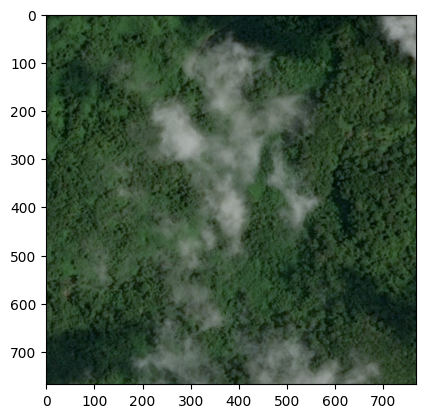

detected:	 FOREST



test_image_01.jpg


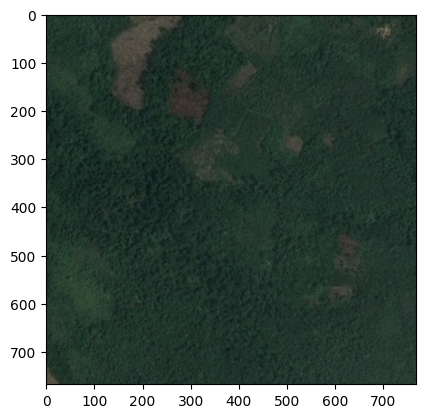

detected:	 FOREST



test_image_02.jpg


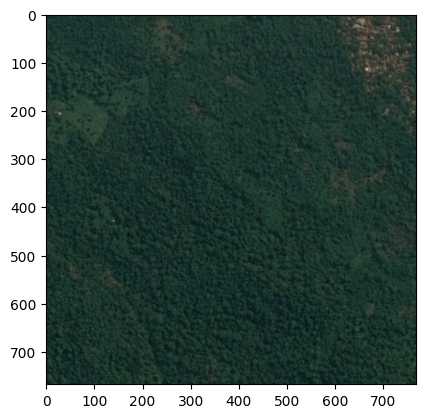

detected:	 FOREST



test_image_03.jpg


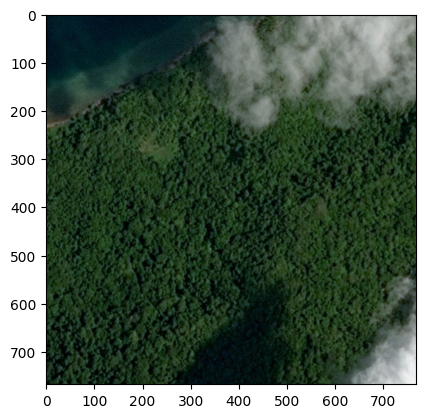

detected:	 FOREST



test_image_04.jpg


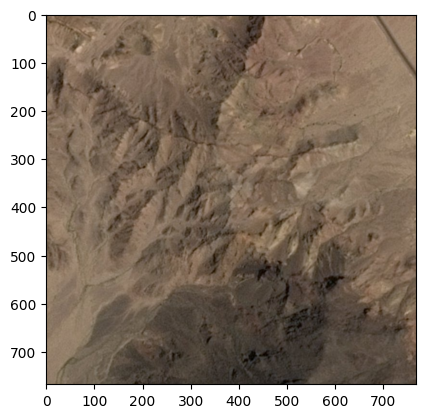

detected:	 DESERT



test_image_05.jpg


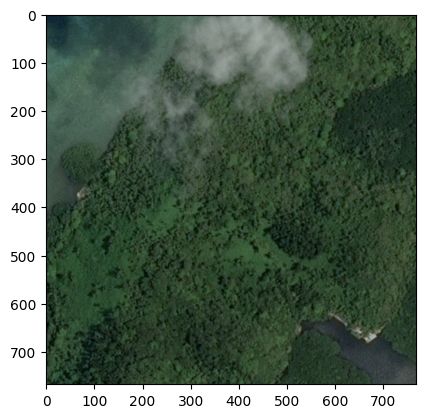

detected:	 FOREST



test_image_06.jpg


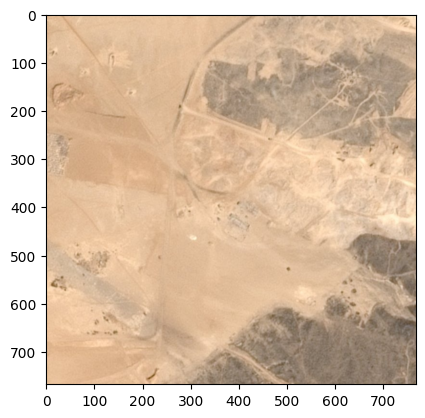

detected:	 DESERT



test_image_07.jpg


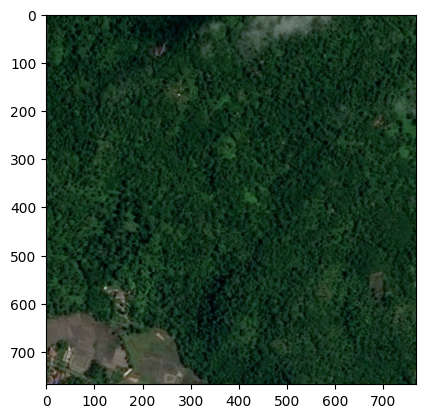

detected:	 FOREST



test_image_08.jpg


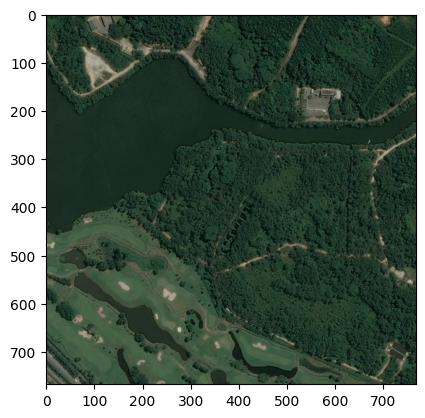

detected:	 FOREST



test_image_09.jpg


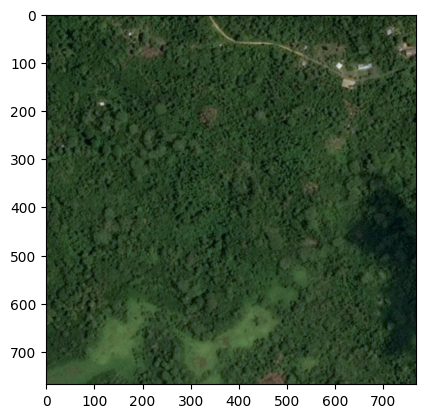

detected:	 FOREST



test_image_10.jpg


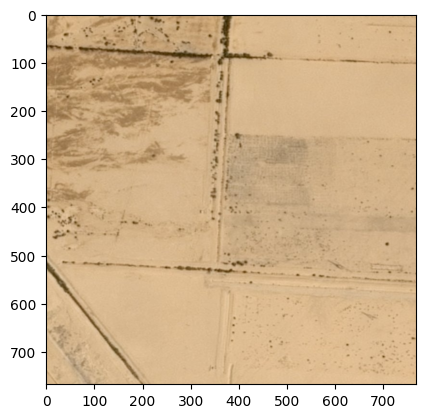

detected:	 DESERT



test_image_11.jpg


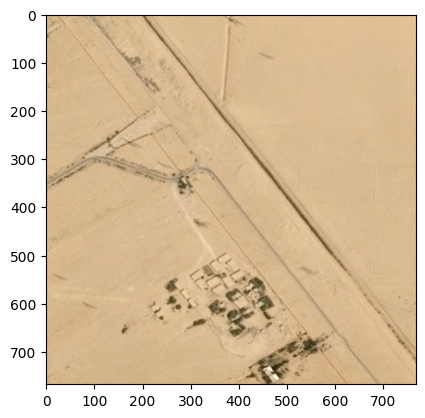

detected:	 DESERT



test_image_12.jpg


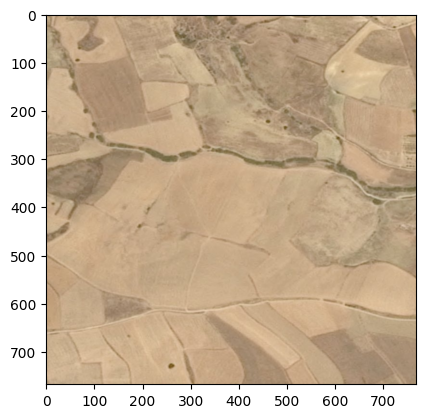

detected:	 DESERT



test_image_13.jpg


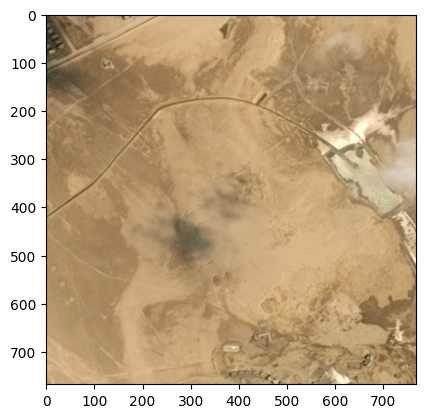

detected:	 DESERT



test_image_14.jpg


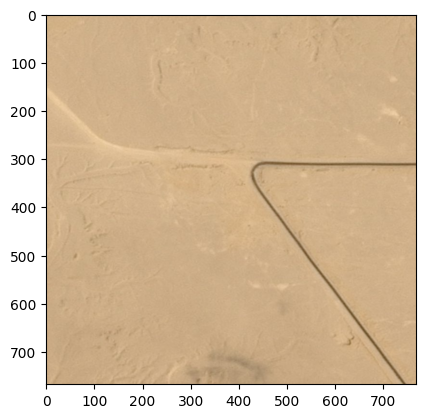

detected:	 DESERT



test_image_15.jpg


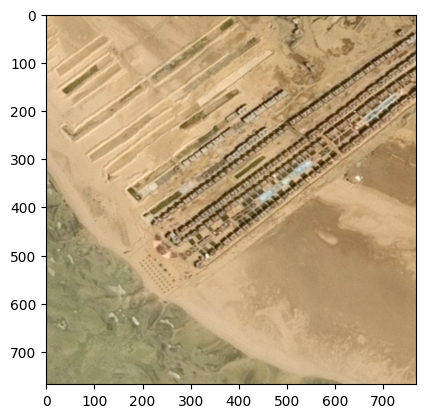

detected:	 DESERT



test_image_16.jpg


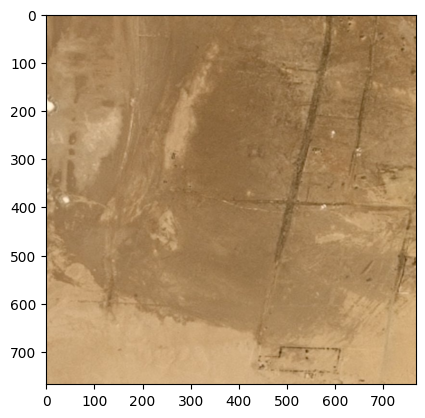

detected:	 DESERT





In [1]:
# Ваш код
import numpy as np
import pylab
import cv2
import os

def forest_detector_9000(img):
    # считаем средние значения по каналам
    blue_mean = img[:,:,0].mean()
    green_mean = img[:,:,1].mean()
    red_mean = img[:,:,2].mean()
    if green_mean > red_mean and green_mean > blue_mean:
        # если зеленый канал ярче всех, значит, лес
        return "FOREST"
    else:
        return "DESERT"

for elm in os.listdir("desert_forest"):
    img = cv2.imread(f'desert_forest/{elm}')
    if img is not None:
        print(elm)
        pylab.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) # cv2 зачем-то реверсит красные и синие пиксели...
        pylab.show()
        print("detected:\t",forest_detector_9000(img))
        print("\n=================================")
        print("\n")

# Задача №2 - Реализовать Image-blending на основе сшивки по градиентам

Задача - взять фото двух лиц : ваше и друга, с помощью метода Poisson image editing совместить глаза, нос и рот с первого изображения со вторым. Суть в том, что при использовании такого метода границы совмещенного изображения не видны.

Статья, где описан метод  

Patrick Pérez, Michel Gangnet, and Andrew Blake. 2003. Poisson image editing. ACM Trans. Graph. 22, 3 (July 2003), 313–318. https://doi.org/10.1145/882262.882269

Пример такого совмещения:

<img src="../homework/blending/blending.png" alt="Drawing" style="width: 700px;"/>


In [2]:
def normalize_image(img):
    img = np.array(img, dtype = np.float32)
    return (img - img.min())/(img.max() - img.min())

def restore_color(image):
    image_s = np.array(image)
    # image_s[:,:,0] = image[:,:,2]
    # image_s[:,:,1] = image[:,:,1]
    # image_s[:,:,2] = image[:,:,0]
    
    pylab.imshow(cv2.cvtColor(np.float32(image_s), cv2.COLOR_BGR2RGB))
    pylab.show()

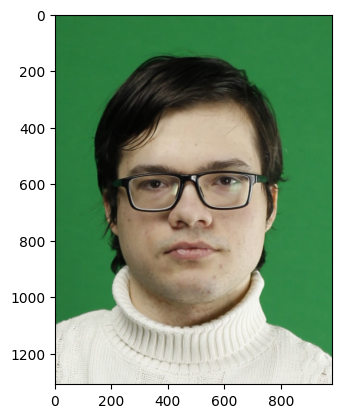

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


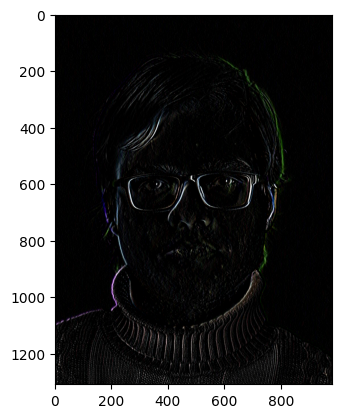

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


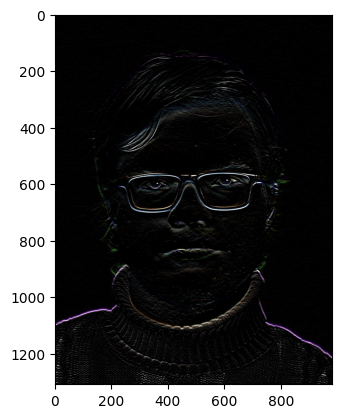

In [3]:
# Ваш код
img = cv2.imread('blending/im1.jpg')

img = np.array(img, dtype = np.float32)
img = normalize_image(img)

drv_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
drv_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
pylab.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
pylab.show()
pylab.imshow(drv_x)
pylab.show()
pylab.imshow(drv_y)
pylab.show()

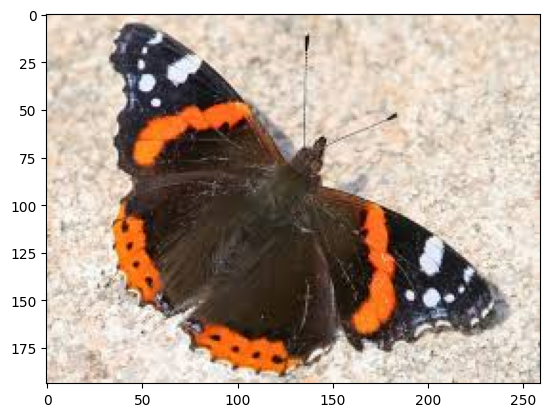

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


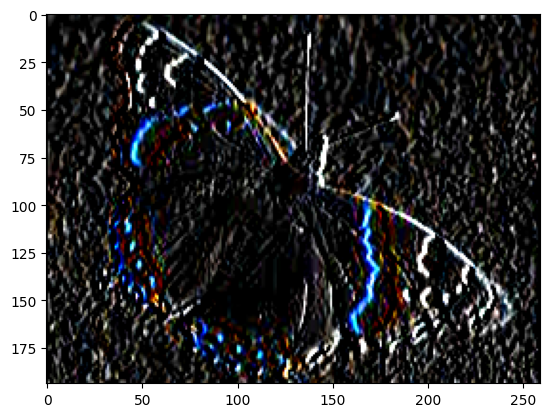

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


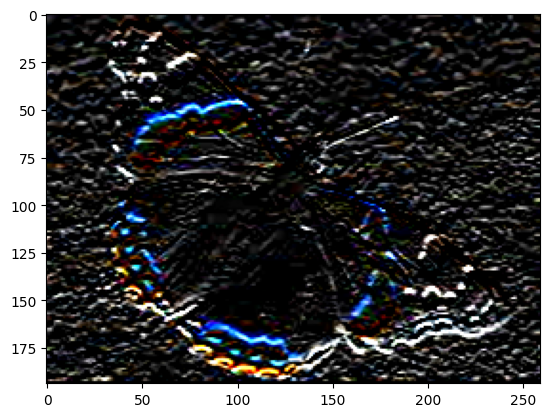

In [4]:
img2 = cv2.imread('blending/im4.jpg')

img2 = np.array(img2, dtype = np.float32)
img2 = normalize_image(img2)

drv2_x = cv2.Sobel(img2, cv2.CV_64F, 1, 0, ksize=3)
drv2_y = cv2.Sobel(img2, cv2.CV_64F, 0, 1, ksize=3)
pylab.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
pylab.show()
pylab.imshow(drv2_x)
pylab.show()
pylab.imshow(drv2_y)
pylab.show()

In [5]:
def gradient_blend(gr1,gr2,offset):
    res_grad = np.zeros(gr1.shape)
    for i in np.arange(gr1.shape[0]):
        for j in np.arange(gr1.shape[1]):
            if i > offset[0] and j > offset[1] and i < gr2.shape[0] + offset[0] and j < gr2.shape[1] + offset[1]:
                res_grad[i,j][0] = gr1[i,j][0] if abs(gr1[i,j][0]) > abs(gr2[i-offset[0], j-offset[1]][0]) else gr2[i-offset[0], j-offset[1]][0]
                res_grad[i,j][1] = gr1[i,j][1] if abs(gr1[i,j][2]) > abs(gr2[i-offset[0], j-offset[1]][1]) else gr2[i-offset[0], j-offset[1]][1]
                res_grad[i,j][0] = gr1[i,j][2] if abs(gr1[i,j][0]) > abs(gr2[i-offset[0], j-offset[1]][2]) else gr2[i-offset[0], j-offset[1]][2]
            else:
                res_grad[i,j] = gr1[i,j]
    return res_grad
    

In [6]:
res_drv_x = gradient_blend(drv_x, drv2_x, [100,100])
res_drv_y = gradient_blend(drv_y, drv2_y, [100,100])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


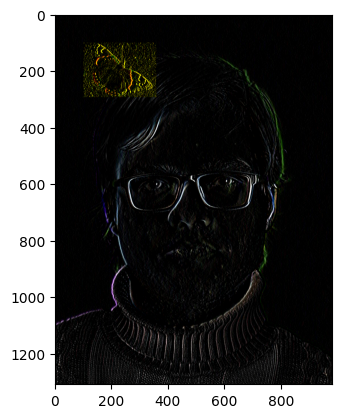

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


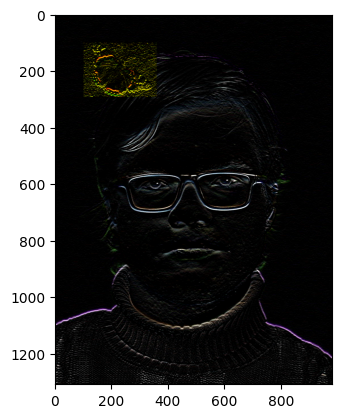

In [7]:
pylab.imshow(res_drv_x)
pylab.show()
pylab.imshow(res_drv_y)
pylab.show()

In [8]:
def restore_from_grad(or_image, drv_to_use_x, drv_to_use_y, norm = True, sp1 = 1, sp2 = 1):
    if sp1 not in [-1,1] or sp2 not in [-1,1]:
        print("sp sould be -1 or 1")
        return None
    range_1 = range(sp1 if sp1 == 1 else or_image.shape[0] - 2, or_image.shape[0] - 1 if sp1 == 1 else 1, 1 if sp1 == 1 else -1)
    range_2 = range(sp2 if sp2 == 1 else or_image.shape[1] - 2, or_image.shape[1] - 1 if sp2 == 1 else 1, 1 if sp2 == 1 else -1)
    # восстановление изображения
    restored_image = np.zeros(or_image.shape)
    # задание граничных условий
    restored_image[:,0] = or_image[:,0]
    restored_image[:,-1] = or_image[:,-1]
    restored_image[0,:] = or_image[0,:]
    restored_image[-1,:] = or_image[-1,:]
    # рассчет изображения на основе граничных условий и градиентов
    for i in range_1:
        for j in range_2:
            restored_image[i,j,0] = restored_image[i,j-sp2,0] + drv_to_use_x[i,j-sp2, 0] * sp2
            restored_image[i,j,0] = restored_image[i-sp1,j,0] + drv_to_use_y[i-sp1,j, 0] * sp1
    
    for i in range_1:
        for j in range_2:
            restored_image[i,j,1] = restored_image[i,j-sp2,1] + drv_to_use_x[i,j-sp2, 1] * sp2
            restored_image[i,j,1] = restored_image[i-sp1,j,1] + drv_to_use_y[i-sp1,j, 1] * sp1
    
    for i in range_1:
        for j in range_2:
            restored_image[i,j,2] = restored_image[i,j-sp2,2] + drv_to_use_x[i,j-sp2, 2] * sp2
            restored_image[i,j,2] = restored_image[i-sp1,j,2] + drv_to_use_y[i-sp1,j, 2] * sp1
    # нормализация и исправление цветов
    if norm:
        restored_image = normalize_image(restored_image)
    else:
        pass
    return restored_image

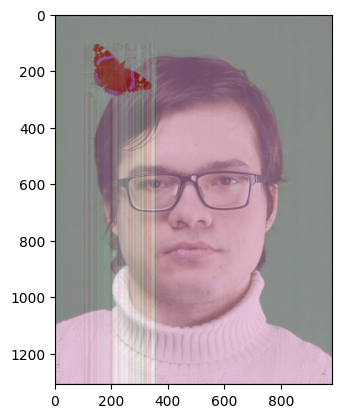

In [9]:
restored_image = restore_from_grad(img, res_drv_x, res_drv_y, norm = True)
restore_color(restored_image)

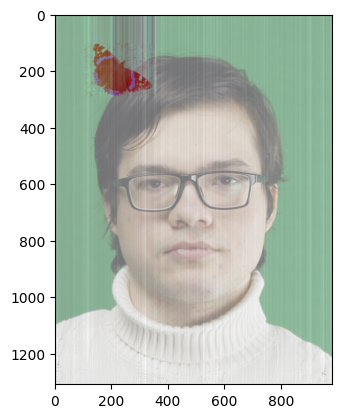

In [10]:
restored_image = restore_from_grad(img, res_drv_x, res_drv_y, norm = True, sp1 = -1, sp2 = -1)
restore_color(restored_image)

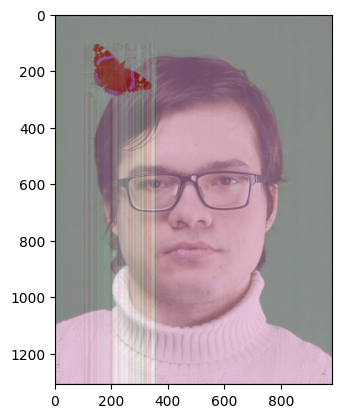

In [11]:
restored_image = restore_from_grad(img, res_drv_x, res_drv_y, norm = True, sp1 = 1, sp2 = -1)
restore_color(restored_image)

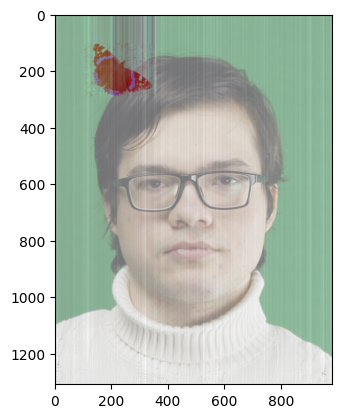

In [12]:
restored_image = restore_from_grad(img, res_drv_x, res_drv_y, norm = True, sp1 = -1, sp2 = 1)
restore_color(restored_image)

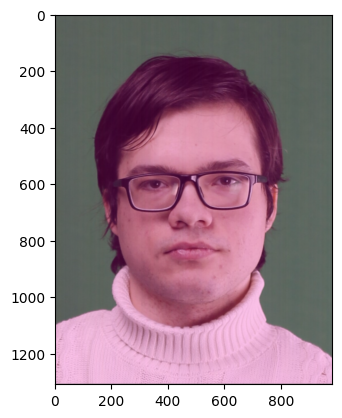

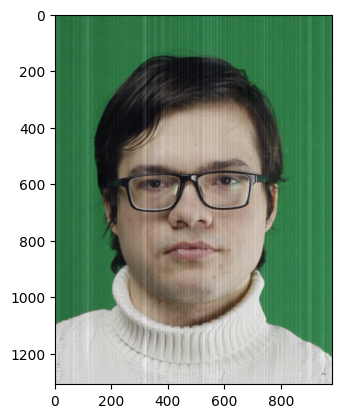

In [13]:
### откуда берутся полоски и сдвиг цвета???????
# почему на основном изображении полоски появляются только при обратном проходе?
restored_image = restore_from_grad(img, drv_x, drv_y, sp1 = 1, sp2 = 1)
restore_color(restored_image)
restored_image = restore_from_grad(img, drv_x, drv_y, sp1 = -1, sp2 = -1)
restore_color(restored_image)

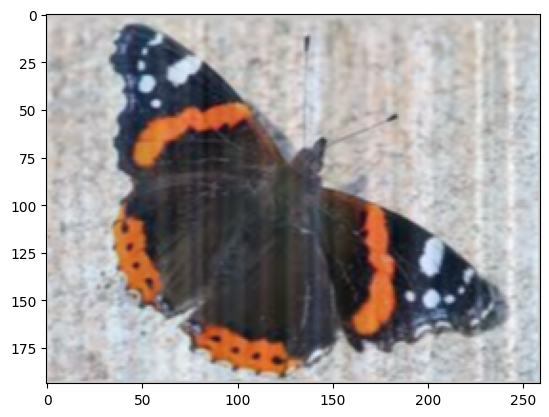

In [14]:
restored_image = restore_from_grad(img2, drv2_x, drv2_y)
restore_color(restored_image)

# Задача №3 - Найди клетки

Даны снимки раковых клеток. Существует задача - определить стадию рака клетки по такому изображению. Для того, чтобы подойти к решению классификации рака клетки, необходимо сначала подготовить данные.

Исходные изображения в реальных задачах могут быть очень большого размера (более 20000 px). Однако из визуального анализа можно заметить, что большая часть этих снимков пустая и не несет в себе полезную информацию.

Ваша задача выделить небольшие ячейки изображений из исходного так, чтобы на ячейках было только изображение клетки.

Пример исходного изображения и нарезанных ячеек клетки.
<img src="../img/cell_example.png" alt="Drawing" style="width: 500px;"/>

В качестве аргументов у функции будут значения:
1. исходное изображние;
2. размер ячейки;
3. количество ячеек.

__Доп вопрос__ - как можно выяснить какие нужны значения аргументов, чтобы они подходили для большинства исходных снимков?

In [120]:
# Ваш код
from tqdm import tqdm
def find_covering_percent(img):
    cvd = 0
    all = 0
    maxel = img.max(0).max(0) # считаем, что фон - это самые яркие пиксели
    cmp = img == maxel
    return 1 - cmp.sum()/np.prod(cmp.shape)
        
def calculate_cell_covering(img, frame_size, frame_cap, threshold = 0.7, step = -1):
    cell_images = []
    if step == -1:
        step = max(img.shape) // 200 # делаем побольше шаг, иначе на одну фотку уходит тип 2 часа
    maxel = img.max(0).max(0)
    
    covering_map = np.zeros(img.shape[0:2])
    frame_number = 0
    while frame_number < frame_cap:
        for i in tqdm(range(0, img.shape[0] - frame_size, step)):
            for j in range(0, img.shape[1] - frame_size, step):
                # print(img[i:i+frame_size, j:j+frame_size])
                if (img[i:i+frame_size, j:j+frame_size] == 255).all():
                    continue
                if (covering_map[i:i+frame_size, j:j+frame_size] == 0).all() and find_covering_percent(img[i:i+frame_size,j:j+frame_size]) > threshold:
                    covering_map[i:i+frame_size, j:j+frame_size] = 1
                    frame_number += 1
                    cell_images.append(img[i:i+frame_size, j:j+frame_size])
        threshold -= 0.1 # если не набрали достаточно фреймов, то пробуем еще раз, с меньшим порогом
        print(f"found {frame_number}/{frame_cap}")
        print(f"threshold is now {threshold}")
        if threshold < 0:
            print(f"threshold is now less then zero. stopping")
            break
            
    return covering_map, cell_images        

100%|████████████████████████████████████████████████████████████████████████████████| 189/189 [00:03<00:00, 50.31it/s]


found 21/16
threshold is now 0.6


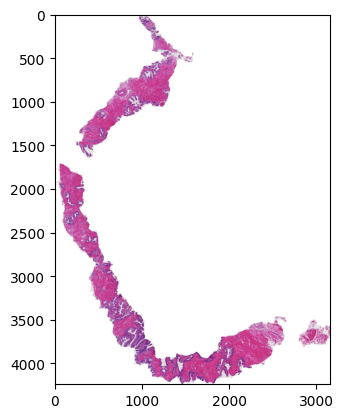

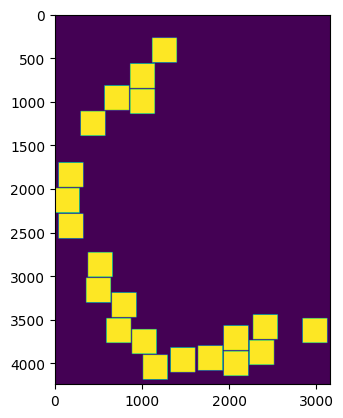

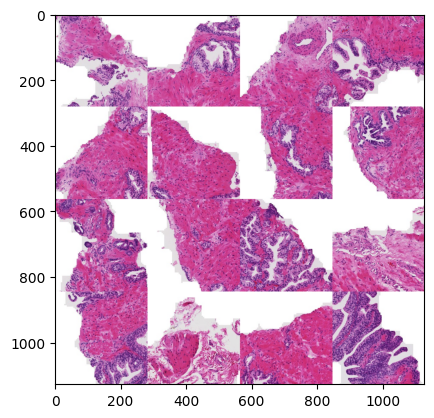

100%|████████████████████████████████████████████████████████████████████████████████| 187/187 [00:03<00:00, 51.61it/s]


found 9/16
threshold is now 0.6


100%|███████████████████████████████████████████████████████████████████████████████| 187/187 [00:01<00:00, 175.29it/s]


found 10/16
threshold is now 0.5


100%|███████████████████████████████████████████████████████████████████████████████| 187/187 [00:00<00:00, 197.07it/s]


found 10/16
threshold is now 0.4


100%|███████████████████████████████████████████████████████████████████████████████| 187/187 [00:00<00:00, 209.64it/s]


found 11/16
threshold is now 0.30000000000000004


100%|███████████████████████████████████████████████████████████████████████████████| 187/187 [00:00<00:00, 211.19it/s]


found 11/16
threshold is now 0.20000000000000004


100%|███████████████████████████████████████████████████████████████████████████████| 187/187 [00:00<00:00, 211.35it/s]


found 11/16
threshold is now 0.10000000000000003


100%|███████████████████████████████████████████████████████████████████████████████| 187/187 [00:00<00:00, 232.96it/s]


found 12/16
threshold is now 2.7755575615628914e-17


100%|███████████████████████████████████████████████████████████████████████████████| 187/187 [00:00<00:00, 251.61it/s]


found 15/16
threshold is now -0.09999999999999998
threshold is now less then zero. stopping


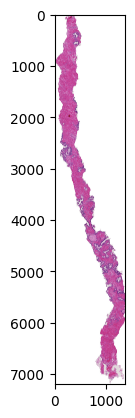

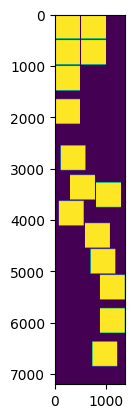

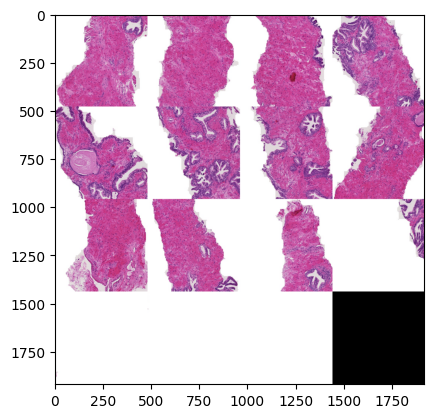

100%|████████████████████████████████████████████████████████████████████████████████| 189/189 [00:08<00:00, 22.90it/s]


found 8/16
threshold is now 0.6


100%|████████████████████████████████████████████████████████████████████████████████| 189/189 [00:04<00:00, 47.16it/s]


found 11/16
threshold is now 0.5


100%|████████████████████████████████████████████████████████████████████████████████| 189/189 [00:03<00:00, 62.20it/s]


found 12/16
threshold is now 0.4


100%|████████████████████████████████████████████████████████████████████████████████| 189/189 [00:02<00:00, 79.13it/s]


found 15/16
threshold is now 0.30000000000000004


100%|████████████████████████████████████████████████████████████████████████████████| 189/189 [00:02<00:00, 78.72it/s]


found 15/16
threshold is now 0.20000000000000004


100%|████████████████████████████████████████████████████████████████████████████████| 189/189 [00:02<00:00, 77.31it/s]


found 15/16
threshold is now 0.10000000000000003


100%|████████████████████████████████████████████████████████████████████████████████| 189/189 [00:02<00:00, 79.60it/s]


found 16/16
threshold is now 2.7755575615628914e-17


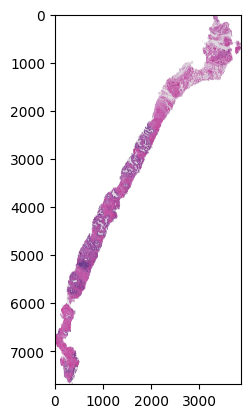

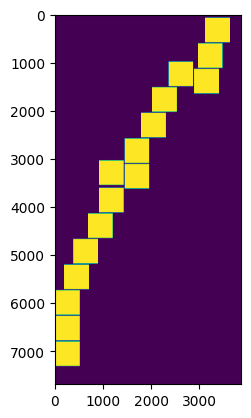

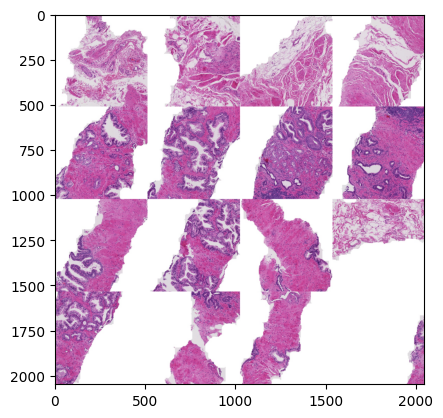

100%|███████████████████████████████████████████████████████████████████████████████| 193/193 [00:01<00:00, 105.71it/s]


found 14/16
threshold is now 0.6


100%|███████████████████████████████████████████████████████████████████████████████| 193/193 [00:00<00:00, 212.16it/s]


found 14/16
threshold is now 0.5


100%|███████████████████████████████████████████████████████████████████████████████| 193/193 [00:00<00:00, 211.91it/s]


found 14/16
threshold is now 0.4


100%|███████████████████████████████████████████████████████████████████████████████| 193/193 [00:00<00:00, 234.52it/s]


found 15/16
threshold is now 0.30000000000000004


100%|███████████████████████████████████████████████████████████████████████████████| 193/193 [00:00<00:00, 236.31it/s]


found 15/16
threshold is now 0.20000000000000004


100%|███████████████████████████████████████████████████████████████████████████████| 193/193 [00:00<00:00, 255.50it/s]


found 17/16
threshold is now 0.10000000000000003


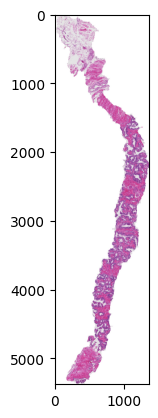

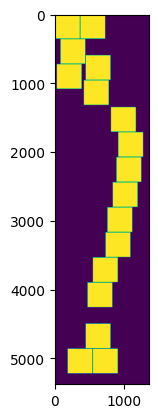

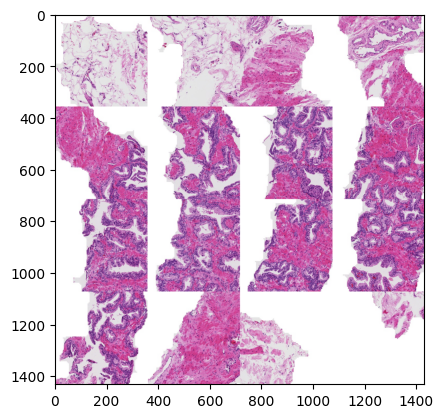

100%|████████████████████████████████████████████████████████████████████████████████| 188/188 [00:04<00:00, 38.19it/s]


found 26/16
threshold is now 0.6


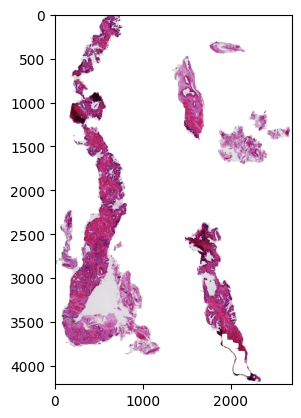

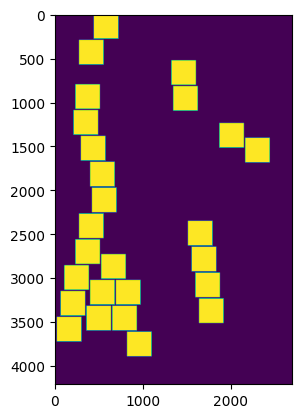

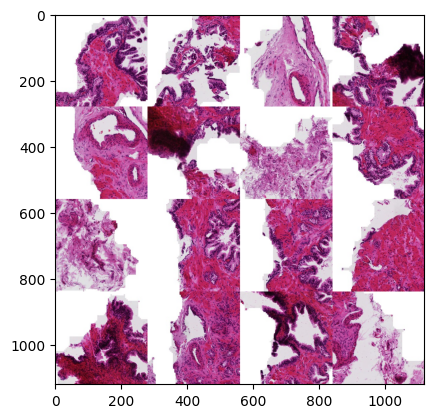

100%|████████████████████████████████████████████████████████████████████████████████| 187/187 [00:01<00:00, 95.38it/s]


found 26/16
threshold is now 0.6


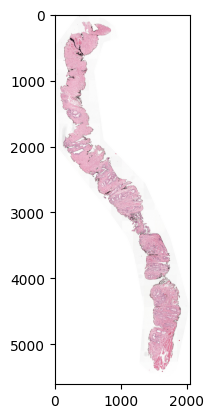

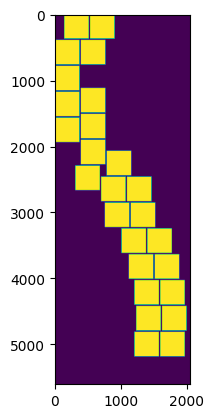

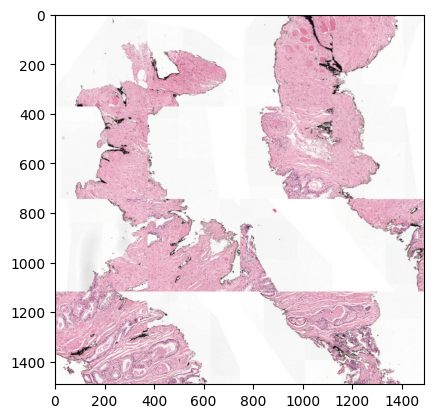

In [122]:
for elm in os.listdir("cells"):
    img = cv2.imread(f'cells/{elm}')
    if img is not None:
        frag_c = 16
        cmap, images = calculate_cell_covering(img, max(img.shape)//15, frag_c)
        pylab.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        pylab.show()
        pylab.imshow(cmap)
        pylab.show()
        # упаковка получившихся изображений в одно
        frag_size = images[0].shape[0]
        joint_image = np.zeros([frag_size*frag_c//4, frag_size*frag_c//4, 3], dtype = np.float32)
        for i in range(frag_c//4):
            for j in range(frag_c//4):
                if i*frag_c//4 + j >= len(images):
                    continue
                joint_image[i*frag_size : i*frag_size + frag_size, j*frag_size : j*frag_size + frag_size] = images[i*frag_c//4 + j]
        pylab.imshow(np.array((cv2.cvtColor(joint_image, cv2.COLOR_BGR2RGB)), dtype = int))
        pylab.show()

относительно допвопроса - можно перебрать некоторый набор значений, и смотреть покрытие получившихся изображений, выбрать значения, для которых покрытие наибольшее  
Также можно заранее посчитать количество пикселей, содержащих клетки, и выбирать такие значения, чтобы сумма количества писелей в фрагментах была примерно равна общему количеству пикселей с клетками
